<a href="https://colab.research.google.com/github/leandrominer85/Panorama_Covid-19/blob/main/Panorama_do_COVID_19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img alt="Colaboratory logo" width="15%" src="https://raw.githubusercontent.com/carlosfab/escola-data-science/master/img/novo_logo_bg_claro.png">

#### **Data Science na Prática 3.0**
*by [sigmoidal.ai](https://sigmoidal.ai)*  

---
  

# Panorama da COVID-19

A pandemia provocada pelo surgimento do Coronavírus SARS-CoV-2 popularmente conhecida como COVID-19 marcou e continua marcando a história do mundo.

Tendo se iniciado na província chinesa de Wuhan no final de 2019 essa doença rapidamente se espalhou até ser declarada como pandemia oficialmente pela Organização Mundial de Saúde em Março de 2021.

Por se tratar de um vírus resíratório altamente transmissível a COVID-19 rapidamente se alastrou pelo mundo. O parco conhecimento da doença e a inexistência de tratamentos eficazes fez com que houvessem milhões de vítimas ao redor do mundo.



<center><img alt="Colaboratory logo" width="40%" src="https://upload.wikimedia.org/wikipedia/commons/thumb/9/94/Coronavirus._SARS-CoV-2.png/1024px-Coronavirus._SARS-CoV-2.png"></center>

Enquanto um terço das pessoas se apresentam assintomáticas - o que dificulta o real dimensionamento da pandemia - 81% das pessoas com sintomas desenvolvem sintomas moderados e 14% sintomas severos. Já a taxa de mortalidade segue a seguinte distribuição etária:


Grupo Etário | Índice de fatalidade
----------   |  --------
0–34         |	0.004%
35–44        |	0.068%
45–54        |	0.23%
55–64        |	0.75%
65–74        |	2.5%
75–84        |	8.5%
85 +         |	28.3%

<div align="center" >
 <a href="https://en.wikipedia.org/wiki/COVID-19_pandemic#History">fonte: wikipedia</a> </div>

Enquanto a vacinação avança e a pandemia infecta mais pessoas surgem novas variantes. Essas variações do vírus original provocam modificações que podem torná-lo mais infeccioso ou aumentar o seu escape vacinal. Portanto, a maneira mais eficaz de prevenção é o distanciamento social e o uso de medidas profiláticas como uso de máscara.

Enquanto esse cenário se desenrola podemos ver como está a evolução da doença ao longo do tempo de acordo com os dados. Nesse projeto utilizarei os dados do [Our World in Data](https://github.com/owid/covid-19-data/tree/master/public/data).

Primeiramente farei uma análise geral da base. Posteriormente dividirei o dataset em três grupos: Mundo, Continentes e Países (com foco no Brasil).

O objetivo é explorar a base retirando insights que demonstrem o panomara geral da doença em cada um dos blocos analisados, dando ênfase à análise gráfica. O ponto de partida será uma análise exploratória e a limpeza de dados para  posterior retirada de conclusões.

## Dicionário de Variáveis

### Não utilizarei todas as variáveis disponíveis (para mais detalhes atentar para a parte de limpeza dos dados). O Dicionário a seguir é apenas das variáveis restantes:


| Variável                         | Descrição                                                           |
|:---------------------------------|:----------------------------------------------------------------------|
| `total_cases`                    | Total  de casos confirmados de  COVID-19                                     |
| `new_cases`                      | Novos casos confirmados de COVID-19                                       |
| `new_cases_smoothed`             | Novos casos confirmados de COVID-19 (média móvel de 7 dias)                      |
| `total_cases_per_million`        | Total de casos confirmados de COVID-19 por 1,000,000 de pessoas                |
| `new_cases_per_million`          | Novos casos confirmados de COVID-19 por 1,000,000 de pessoas                  |
| `new_cases_smoothed_per_million` | Média móvel de 7 dias de novos casos confirmados de COVID-19 por 1,000,000 de pessoas|
| `total_deaths`                    | Total de mortes atribuídas à COVID-19                                     |
| `new_deaths`                      | Novas de mortes atribuídas à COVID-19                                       |
| `new_deaths_smoothed`             | Novas mortes atribuídas à COVID-19 (média móvel de 7 dias)                      |
| `total_deaths_per_million`        | Total de mortes atribuídas à COVID-19 por 1,000,000 de pessoas                |
| `new_deaths_per_million`          | Novas mortes atribuídas à COVID-19 por 1,000,000 pessoas                  |
| `new_deaths_smoothed_per_million` | Novas mortes atribuídas à COVID-19 (média móvel de 7 dias) por 1,000,000 de pessoas |
| `total_vaccinations`                         | Número total de vacinas de COVID-19 aplicadas                                                                                                                                                                                                                                                                                           |
| `people_vaccinated`                          | Número total de pessoas com pelo menos uma dose de vacina                                                                                                                                                                                                                                                                                     |
| `people_fully_vaccinated`                    | Número total de pessoas com o esquema vacinal completo                                                                                                                                                                                                                                                              |
| `total_boosters`                             | Número total de vacinas de  COVID-19 aplicadas além do esquema vacinal mínimo                                                                                                                                                                                                     |
| `new_vaccinations`                           | Novas vacinas de COVID-19 administradas (calculadas apenas para dias consecutivos)                                                                                                                                                                                                                                                                |
| `new_vaccinations_smoothed`                  | Novas doses de vacinas de COVID-19 administradas (média móvel de 7 dias). Para países que não reportam os dados diariamente assumimos que a mudança se dá de forma equânime nos dias referentes aos dados. Isso produz uma série diária na qual a média diária de sete dias é  retirada |
| `total_vaccinations_per_hundred`             | Número total de vacinas de COVID-19 administradas por 100 pessoas no total da população                                                                                                                                                                                                                                                    |
| `people_vaccinated_per_hundred`              | Pessoas vacinadas por 100 pessoas no total da população                                                                                                                                                                                                                                              |
| `people_fully_vaccinated_per_hundred`        |Pessoas com o esquema vacinal completo por 100 pessoas no total da população                                                                                                                                                                                                                       |
| `total_boosters_per_hundred`                 | Número de vacinas de COVID-19 além do esquema vacinal mínimo aplicadas por 100 pessoas no total da população                                                                                                                                                                                                                                           |
| `new_vaccinations_smoothed_per_million`      | Novas doses de vacinas aplicadas (média móvel de 7 dias) por 1,000,000 pessoas no total da população                                                                                                                                                                                                                                         |
| `new_people_vaccinated_smoothed`             | Número de pessoas recebendo a primeira dose no dia (média móvel de 7 dias)                                                                                                                                                                                                                                                                        |
| `new_people_vaccinated_smoothed_per_hundred` |úmero de pessoas recebendo a primeira dose no dia (média móvel de 7 dias) por 100 pessoas no total da população                                                                                                                                                       
| `iso_code`                   | [ISO 3166-1 alpha-3](https://pt.wikipedia.org/wiki/ISO_3166-1_alfa-3) – código de três letras para os países                                                                                                                                                                                            |
| `continent`                  | Continente correspondente à localidade                                                                                                                                                                                                     |
| `location`                   | Localidade geográfica                                                                                                                                                                                                                      |
| `date`                       | Data da observação                                                                                                                                                                                                                        |
| `population`                 | População (últimos valores disponíveis). Veja: https://github.com/owid/covid-19-data/blob/master/scripts/input/un/population_latest.csv para os dados completos                                                                                |
| `population_density`         | Número de pessoas dividido pela área, medido em Kilometros quadrados, último ano disponível                                                                                                                                           |
| `median_age`                 | Mediana da idade da população, projeçao da ONU para 2020                                                                                                                                                                                       |
| `aged_65_older`              | Parcela da população com mais de 65 , último ano disponível                                                                                                                                                             |
| `aged_70_older`              | Parcela da população com mais de 75 , em 2015                                                                                                                                                                                 |
| `gdp_per_capita`             | Produto doméstico bruto de acordo com a [paridade de poder de compra](https://pt.wikipedia.org/wiki/Paridade_do_poder_de_compra#:~:text=Em%20economia%20a%20paridade%20do,de%20compra%20de%20dois%20pa%C3%ADses.&text=A%20PPC%2C%20ao%20rev%C3%A9s%2C%20leva,diferen%C3%A7as%20no%20custo%20de%20vida.)  (constante para 2011 em dólares americanos), ano mais recente disponível                                                                                                                        |
| `extreme_poverty`            | Percentagem da população vivendo em extrema pobreza, ano mais recente disponível a partir de 2010                                                                                                                                                   |
| `cardiovasc_death_rate`      | Taxa de morte por doenças cardiovasculares em 2017 número anual de mortes por 100,000 pessoas)                                                                                                                                                |
| `diabetes_prevalence`        | Prevalência de diabetes (% da população entre 20 to 79 anos) em 2017                                                                                                                                                                                |
| `female_smokers`             | Percentagem de mulheres fumantes, ano mais recente disponível                                                                                                                                                                                       |
| `male_smokers`               | Percentagem de homens fumantes, ano mais recente disponível                                                                                                                                                                                         |
| `handwashing_facilities`     | Percentagem da população com acesso a instalações para lavagem de mãos no local, ano mais recente disponível                                                                                                                                          |
| `hospital_beds_per_thousand` | Número de leitos disponíveis por 1,000 people, ano mais recente disponível a partir de  2010                                                                                                                                                                      |
| `life_expectancy`            | Expectativa de vida em 2019                                                                                                                                                                                                           |
| `human_development_index`    | [IDH](https://www.br.undp.org/content/brazil/pt/home/idh0.html) - Índice de desenvolvimento humano. Composto por três dimensões básicas do desenvolvimento humano: renda, educação e saúde Valores para 2019, importados de : http://hdr.undp.org/en/indicators/137506 |


In [1]:
#Instalando o ipywidgets
!pip install ipywidgets -q

In [2]:
#Instalando o Barchartrace
!pip install bar_chart_race -q

     |████████████████████████████████| 156 kB 26.1 MB/s 


In [3]:
# importar as bibliotecas necessárias
import pandas as pd
import matplotlib.pyplot as plt
from ipywidgets import Box
from ipywidgets import interact, fixed, interact_manual
import ipywidgets as widgets
import matplotlib.dates as mdates
import bar_chart_race as bcr
import seaborn as sns
pd.set_option('display.max_rows', 500)

In [4]:
# Resolvendo um bug (https://stackoverflow.com/questions/57126647/how-to-change-xticks-to-yearly-interval-in-pandas-time-series-plot/57129081#57129081)
pd.plotting.plot_params = {'x_compat': True}

#**Análise e limpeza do dataframe completo**

In [5]:
# importar o dataset COVID-19 para um DataFrame
df= pd.read_csv('https://covid.ourworldindata.org/data/owid-covid-data.csv', parse_dates=['date'], )

In [6]:
df.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,0.126,0.126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN


In [7]:
#Formato do df
df.shape

(139589, 67)

In [8]:
#Verificando a existência de valores para o mundo
df[df['location'] == 'World']

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
137018,OWID_WRL,NaN,World,2020-01-22,557.0,0.0,NaN,17.0,0.0,NaN,0.071,0.000,NaN,0.002,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
137019,OWID_WRL,NaN,World,2020-01-23,655.0,98.0,NaN,18.0,1.0,NaN,0.083,0.012,NaN,0.002,0.000,NaN,3.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
137020,OWID_WRL,NaN,World,2020-01-24,941.0,286.0,NaN,26.0,8.0,NaN,0.119,0.036,NaN,0.003,0.001,NaN,3.28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
137021,OWID_WRL,NaN,World,2020-01-25,1434.0,493.0,NaN,42.0,16.0,NaN,0.182,0.063,NaN,0.005,0.002,NaN,3.43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
137022,OWID_WRL,NaN,World,2020-01-26,2118.0,684.0,NaN,56.0,14.0,NaN,0.269,0.087,NaN,0.007,0.002,NaN,3.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137704,OWID_WRL,NaN,World,2021-12-08,267834341.0,671165.0,616436.000,5279202.0,7974.0,7727.429,34010.858,85.228,78.278,670.378,1.013,0.981,1.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.328086e+09,4.365272e+09,3.551872e+09,325179224.0,36557869.0,33561663.0,105.75,55.43,45.10,4.13,4262.0,8214933.0,0.104,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
137705,OWID_WRL,NaN,World,2021-12-09,268558266.0,723925.0,619662.000,5287902.0,8700.0,7542.429,34102.785,91.927,78.688,671.483,1.105,0.958,1.02,NaN,NaN,N

In [9]:
# Quais as colunas do df ?
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

In [10]:
#Estatísticas descritivas
df.describe()

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
count,1.318270e+05,131822.000000,130782.000000,1.204620e+05,120658.000000,130782.000000,131152.000000,131147.000000,130112.000000,119800.000000,119996.000000,130112.000000,110530.000000,17102.000000,17102.000000,19543.000000,19543.000000,1329.000000,1329.000000,2213.000000,2213.000000,5.843000e+04,5.856300e+04,58563.000000,58430.000000,7.038800e+04,70388.000000,66282.000000,65621.000000,3.671400e+04,3.507800e+04,3.214800e+04,9.490000e+03,3.052500e+04,6.603800e+04,36714.000000,35078.000000,32148.000000,9490.000000,66038.000000,6.487500e+04,64875.000000,113378.000000,1.385970e+05,126354.000000,120303.000000,118975.000000,119647.000000,121112.000000,80884.000000,120521.000000,124575.000000,93839.000000,92485.000000,60658.000000,109462.000000,129776.000000,120614.000000,4881.000000,4881.000000,4881.000000,4881.000000
mean,2.200580e+06,8560.203646,8570.494686,5.343607e+04,182.543404,167.773252,21537.560084,91.369734,91.322857,430.612558,1.599258,1.467640,0.996404,884.814817,22.708672,4043.837691,159.899962,257.887133,17.878063,3323.913692,90.077854,5.910424e+04,1.310322e+07,555.894336,2.648964,5.540552e+04,2.525476,0.085503,159.648372,1.247698e+08,6.707070e+07,4.824928e+07,5.120585e+06,1.095372e+06,5.168065e+05,56.757820,32.070614,25.938681,3.803497,3404.915412,2.652126e+05,0.173799,55.845926,1.567780e+08,402.979401,30.488960,8.737348,5.526711,19233.894995,13.529341,260.151253,8.052945,10.586077,32.753412,50.836326,3.027797,73.261783,0.726008,34081.168408,9.300443,16.473342,846.448426
std,1.248405e+07,44546.077046,43947.286101,2.734509e+05,864.061734,811.575593,35366.520844,215.895120,182.921300,695.784486,4.131301,3.124123,0.341411,2772.448744,24.777793,11102.630459,213.462726,529.455781,32.824563,10468.817894,142.110559,1.987878e+05,5.314157e+07,1349.330571,7.233811,1.778533e+05,5.996355,0.095145,830.421133,5.776653e+08,3.158270e+08,2.397031e+08,2.133623e+07,4.172402e+06,2.813669e+06,53.370835,27.019132,25.049229,7.944270,4063.690232,2.429043e+06,0.275463,20.595930,7.268348e+08,1880.163097,9.113892,6.177940,4.212203,20091.733680,20.000423,119.895311,4.324992,10.500071,13.517832,31.816863,2.454046,7.529312,0.150012,95174.579608,17.397939,31.774410,1254.158036
min,1.000000e+00,-74347.000000,-6223.000000,1.000000e+00,-1918.000000,-232.143000,0.001000,-3125.829000,-272.971000,0.000000,-75.911000,-10.844000,-0.030000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,1.000000,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,

In [33]:
# Quais variáveis têm grande número de dados ausentes
df.isnull().sum().sort_values(ascending=False)/len(df)

weekly_icu_admissions                         0.990479
weekly_icu_admissions_per_million             0.990479
weekly_hosp_admissions_per_million            0.984146
weekly_hosp_admissions                        0.984146
excess_mortality_cumulative_per_million       0.965033
excess_mortality                              0.965033
excess_mortality_cumulative_absolute          0.965033
excess_mortality_cumulative                   0.965033
total_boosters_per_hundred                    0.932015
total_boosters                                0.932015
icu_patients_per_million                      0.877483
icu_patients                                  0.877483
hosp_patients                                 0.859996
hosp_patients_per_million                     0.859996
new_vaccinations                              0.781322
people_fully_vaccinated_per_hundred           0.769695
people_fully_vaccinated                       0.769695
people_vaccinated                             0.748705
people_vac

In [12]:
# Quais os tipos das variáveis?
df.dtypes

iso_code                                              object
continent                                             object
location                                              object
date                                          datetime64[ns]
total_cases                                          float64
new_cases                                            float64
new_cases_smoothed                                   float64
total_deaths                                         float64
new_deaths                                           float64
new_deaths_smoothed                                  float64
total_cases_per_million                              float64
new_cases_per_million                                float64
new_cases_smoothed_per_million                       float64
total_deaths_per_million                             float64
new_deaths_per_million                               float64
new_deaths_smoothed_per_million                      float64
reproduction_rate       

In [13]:
# Qual a data mais antiga para a série de dados?
df.date.min()

Timestamp('2020-01-01 00:00:00')

In [14]:
#E qual a mais atual ?
df.date.max()

Timestamp('2021-12-12 00:00:00')

### Aqui selecionarei algumas variáveis para retirar do dataframe. Dois critérios foram seguidos: variáveis sem interesse para a análise (como internados nas UTIs) e variáveis com alta taxa de dados faltantes (como excesso de mortalidade)

### É preciso salientar que vairiáveis como vacinas aplicadas têm um grande número de dados faltantes por razões intrínsecas à natureza da pandemia (as vacinas só foram desenvolvidas num período de tempo já avançado e mantêm uma distribuição geográfica desigual. Tais variáveis foram mantidas pelo seu interesse na análise.

In [15]:
#Limpando a base geral
df_clean = df.drop(labels=[ 'icu_patients','icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'stringency_index',
       'excess_mortality_cumulative_absolute', 'excess_mortality_cumulative',
       'excess_mortality', 'excess_mortality_cumulative_per_million'],axis=1)

### Para que os dados da pandemia (infecções e mortes) e os dados de vacinação tenham o mesmo lapso temporal preenchi os dados de vacinação ausentes com 0. Parto do suposto que a ausência de dados nessas entradas se deva à ausência de vacinas desenvolvidas no início da pandemia.

In [16]:
cols = ['total_vaccinations',	'people_vaccinated', 	'people_fully_vaccinated',	'total_boosters',
        'new_vaccinations',	'new_vaccinations_smoothed',	'total_vaccinations_per_hundred',
        'people_vaccinated_per_hundred',	'people_fully_vaccinated_per_hundred',	'total_boosters_per_hundred',
        'new_vaccinations_smoothed_per_million',	'new_people_vaccinated_smoothed',	'new_people_vaccinated_smoothed_per_hundred']
df_clean[cols] = df_clean[cols].fillna(value=0)

In [17]:
#Verificando a lista de locais:
df_clean.location.unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Asia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethi

### Procederei aqui à divisão do dataframe nos três níveis de análise: mundial, continentes e Brasil.

In [18]:
#Lista de variáveis a serem retiradas
drop_list = ['European Union', "High income" , "International", 'Low income', 'Lower middle income' , "Upper middle income", "World"]

In [19]:
#Lista dos continentes
continent_list = ["Africa", 'Asia', 'North America', 'Oceania', 'South America', 'Europe']

In [20]:
# Dataframe mundial
world = df_clean.loc[df_clean['location']=='World']

In [21]:
# Dataframe continental
continents = df_clean[df_clean['location'].isin(continent_list)]

In [22]:
continents.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
658,OWID_AFR,NaN,Africa,2020-02-13,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0.000,NaN,NaN,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
659,OWID_AFR,NaN,Africa,2020-02-14,1.0,1.0,NaN,NaN,0.0,NaN,0.001,0.001,NaN,NaN,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
660,OWID_AFR,NaN,Africa,2020-02-15,1.0,0.0,NaN,NaN,0.0,NaN,0.001,0.000,NaN,NaN,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
661,OWID_AFR,NaN,Africa,2020-02-16,1.0,0.0,NaN,NaN,0.0,NaN,0.001,0.000,NaN,NaN,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
662,OWID_AFR,NaN,Africa,2020-02-17,1.0,0.0,NaN,NaN,0.0,NaN,0.001,0.000,NaN,NaN,0.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [23]:
#Dataframe países
countries = df_clean[~df_clean['location'].isin(drop_list+continent_list)]

In [24]:
countries.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,0.126,0.126,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,0.126,0.000,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511


In [25]:
br = df_clean[df_clean['location']== 'Brazil']

In [26]:
br.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,total_boosters_per_hundred,new_vaccinations_smoothed_per_million,new_people_vaccinated_smoothed,new_people_vaccinated_smoothed_per_hundred,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
17402,BRA,South America,Brazil,2020-02-26,1.0,1.0,NaN,NaN,NaN,NaN,0.005,0.005,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,213993441.0,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,8.11,10.1,17.9,NaN,2.2,75.88,0.765
17403,BRA,South America,Brazil,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,0.005,0.000,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,213993441.0,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,8.11,10.1,17.9,NaN,2.2,75.88,0.765
17404,BRA,South America,Brazil,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,0.005,0.000,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,213993441.0,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,8.11,10.1,17.9,NaN,2.2,75.88,0.765
17405,BRA,South America,Brazil,2020-02-29,2.0,1.0,NaN,NaN,NaN,NaN,0.009,0.005,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,213993441.0,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,8.11,10.1,17.9,NaN,2.2,75.88,0.765
17406,BRA,South America,Brazil,2020-03-01,2.0,0.0,NaN,NaN,NaN,NaN,0.009,0.000,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,213993441.0,25.04,33.5,8.552,5.06,14103.452,3.4,177.961,8.11,10.1,17.9,NaN,2.2,75.88,0.765


## Análise Exploratória dos Dados Mundiais

In [ ]:
#Verificando os dados faltantes
(world.isnull().sum() / world.shape[0]).sort_values(ascending=False)

continent                                     1.000000
new_cases_smoothed_per_million                0.008721
new_cases_smoothed                            0.008721
new_deaths_smoothed_per_million               0.008721
new_deaths_smoothed                           0.008721
reproduction_rate                             0.007267
human_development_index                       0.000000
people_fully_vaccinated                       0.000000
people_vaccinated                             0.000000
total_vaccinations                            0.000000
new_deaths_per_million                        0.000000
total_deaths_per_million                      0.000000
total_cases_per_million                       0.000000
new_cases_per_million                         0.000000
new_vaccinations                              0.000000
new_deaths                                    0.000000
total_deaths                                  0.000000
new_cases                                     0.000000
total_case

Vou definir as variáveis a seguir para utilizar em diversos gráficos:

In [30]:
# Dados das variantes (https://www.who.int/en/activities/tracking-SARS-CoV-2-variants/)

# Corrdenadas para o eixo x:
xcoords = ['2020-12-18',  "2021-01-11", "2021-05-11", "2021-11-26"]
# Cores para as linhas
colors = ['r','k','b','y']
# labels
variantes = ['Alpha e Beta', 'Gamma', 'Delta', 'Omicron']

#Formatter
formatter = mdates.DateFormatter('%b-%Y') 

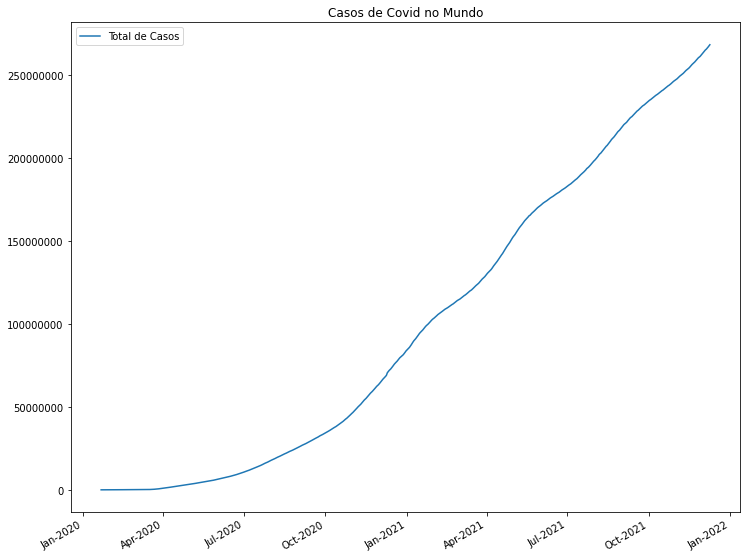

In [ ]:
# Evolução dos Casos de Covid ao longo do tempo

#Iniciando o gráfico
fig,ax = plt.subplots(figsize=(12,10))

#Plotando o gráfico
world.plot(y='total_cases' , x = 'date', ax=ax)

#Título
ax.set_title("Casos de Covid no Mundo")

#Retirando a notação científica
ax.ticklabel_format(useOffset=False, style='plain', axis='y')

#Retirando o label do eixo x
ax.xaxis.label.set_visible(False)

#Adicionando a legenda
ax.legend(labels=['Total de Casos'], loc='upper left')

#Modificando o eixo
plt.gcf().axes[0].xaxis.set_major_formatter(formatter)



plt.show()

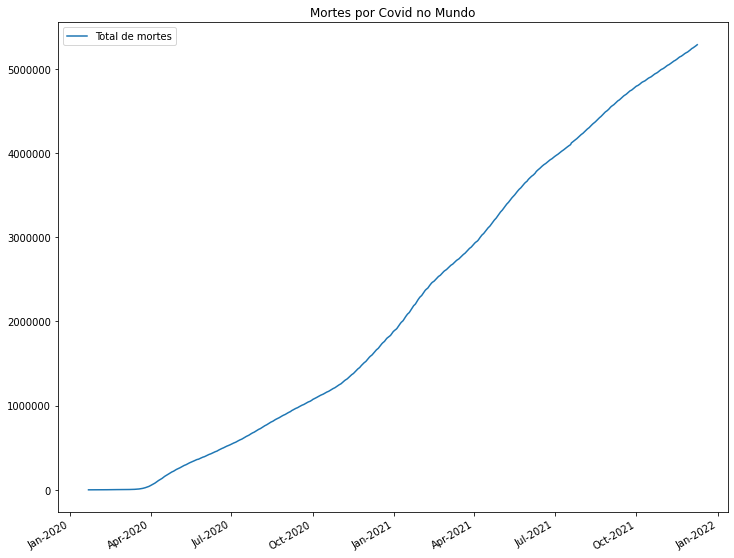

In [ ]:
# Evolução das mortes por Covid ao longo do tempo
fig,ax = plt.subplots(figsize=(12,10))
world.plot(y='total_deaths' , x = 'date', ax=ax)
ax.set_title("Mortes por Covid no Mundo")

ax.ticklabel_format(useOffset=False, style='plain', axis='y')
ax.legend(labels=['Total de mortes'], loc='upper left')
plt.gcf().axes[0].xaxis.set_major_formatter(formatter)
ax.xaxis.label.set_visible(False)
plt.show()

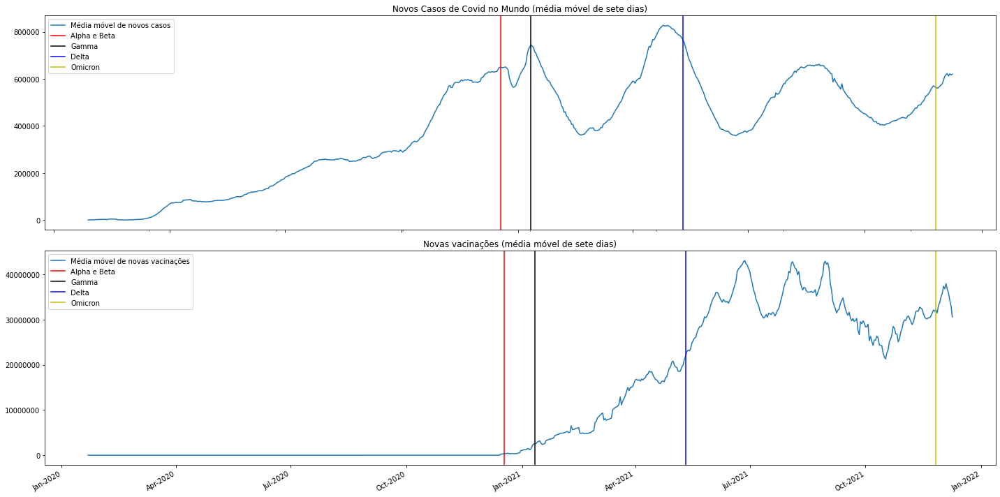

In [ ]:
# Evolução da média móvel dos novos casos de Covid e de novas vacinações ao longo do tempo

#Iniciando o gráfico com dois plots
fig,ax = plt.subplots(nrows=2, ncols=1,figsize=(20,10))

# Plotando o primeiro gráfico
world.plot(y='new_cases_smoothed' , x = 'date', ax=ax[0], sharex=ax[1])

#Adicionando o tírulo
ax[0].set_title("Novos Casos de Covid no Mundo (média móvel de sete dias)")

#Retiran a notação científica
ax[0].ticklabel_format(useOffset=False, style='plain', axis='y')

#Retirando o label do eixo x
ax[0].xaxis.label.set_visible(False)


#Plotando o segundo gráfico
world.plot(y='new_vaccinations_smoothed' , x = 'date', ax=ax[1])

#Adicionando o tírulo
ax[1].set_title("Novas vacinações (média móvel de sete dias)")

#Retirando a notação científica
ax[1].ticklabel_format(useOffset=False, style='plain', axis='y')

#Retirando o label do eixo x
ax[1].xaxis.label.set_visible(False)

#Utilizando os dados das variantes para plotar as linhas
#Loop por todas as coordenadas e cores
for xc,c in zip(xcoords,colors):
    #Plotando em cada um dos gráficos
    ax[0].axvline(x=xc, c=c)
    ax[1].axvline(x=xc, c=c)

#Adicionando as legendas dos dados e das variantes em cada gráfico
ax[0].legend(labels=['Média móvel de novos casos'] + variantes, loc='upper left')
ax[1].legend(labels=['Média móvel de novas vacinações'] + variantes, loc='upper left')

#Formatando o eixo x
plt.gcf().axes[1].xaxis.set_major_formatter(formatter)


fig.tight_layout();

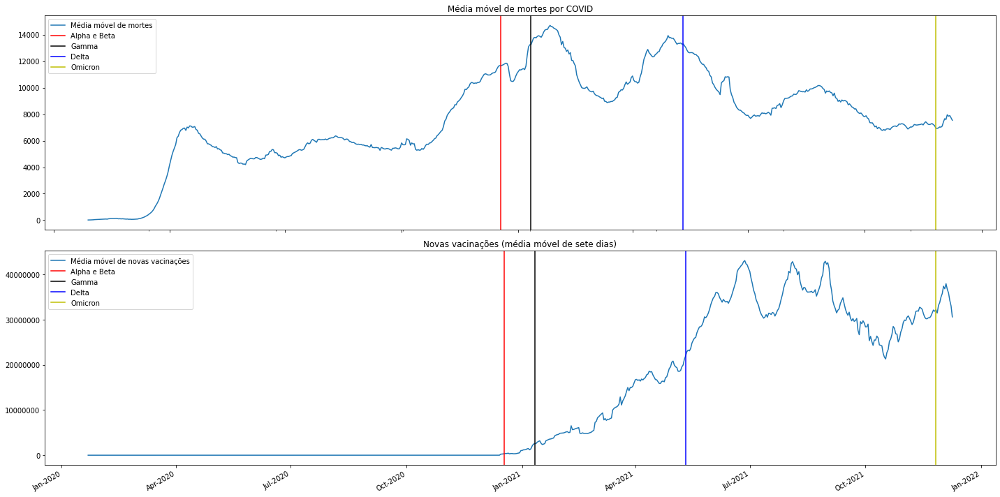

In [ ]:
# Evolução da média móvel de mortes por Covid e de novas vacinações ao longo do tempo
fig,ax = plt.subplots(nrows=2, ncols=1,figsize=(20,10))

world.plot(y='new_deaths_smoothed' , x = 'date', ax=ax[0], sharex=ax[1])
ax[0].set_title("Média móvel de mortes por COVID")
ax[0].ticklabel_format(useOffset=False, style='plain', axis='y')
ax[0].xaxis.label.set_visible(False)

world.plot(y='new_vaccinations_smoothed' , x = 'date', ax=ax[1])
ax[1].set_title("Novas vacinações (média móvel de sete dias)")
ax[1].ticklabel_format(useOffset=False, style='plain', axis='y')
ax[1].xaxis.label.set_visible(False)


plt.gcf().axes[1].xaxis.set_major_formatter(formatter)

for xc,c in zip(xcoords,colors):
    ax[0].axvline(x=xc, c=c)
    ax[1].axvline(x=xc, c=c)

ax[0].legend(labels=['Média móvel de mortes'] + variantes, loc='upper left')
ax[1].legend(labels=['Média móvel de novas vacinações'] + variantes, loc='upper left')


fig.tight_layout();

### Criação do gráfico interativo para casos e mortes:

In [ ]:
# Função para plotar o gráfico

def f(date_range,dados):
  #range de datas
  a=date_range[0]
  b= date_range[1]

  #iniciando o plot
  fig,ax = plt.subplots(figsize=(20,10))

  #subset do dataframe com as datas
  world2= world[ world.date.between(a, b)]

  #Plotando o gráfico utilizando a coluna dados
  world2.plot(y=dados , x = 'date', ax=ax)
 
  ##Retirando a notação científica, o label do eixo x e a legenda
  ax.ticklabel_format(useOffset=False, style='plain', axis='y')
  ax.get_legend().remove()

  ax.xaxis.label.set_visible(False)

  plt.gcf().axes[0].xaxis.set_major_formatter(formatter)
  fig.tight_layout();

In [ ]:
# Criando o Dropdown menu com as colunas de interesse
drop= widgets.Dropdown(
    options=[('Total de casos' ,'total_cases')	,('Novos Casos' , 'new_cases')	,('Média Móvel de novos casos' ,'new_cases_smoothed'),
        ('Total de mortes','total_deaths'),('Novas Mortes',	'new_deaths') ,('Média Móvel de Novas Mortes' ,"new_deaths_smoothed")],
        description='Dados:',
        disabled=False,
)

In [ ]:
# Criando o Slider para as datas

#Range das datas
dates = pd.date_range(world.date.min(),world.date.max(), freq='M')

#Setando as opções que aparecerão
options = [(date.strftime(' %Y-%m-%d '), date) for date in dates]
index = (0, len(options)-1)

#Instanciando o slider
selection_range_slider = widgets.SelectionRangeSlider(
    options=options,
    index=index,
    description='Datas',
    orientation='horizontal',
    layout={'width': '500px'}
)


In [ ]:
# Iniciando o gráfico
interact(f,date_range = selection_range_slider, dados = drop)

interactive(children=(SelectionRangeSlider(description='Datas', index=(0, 22), layout=Layout(width='500px'), o…

<function __main__.f>

## Análise Exploratória dos Dados Continentais

### Quais continentes foram mais afetados pela pandemia?
Primeiramente vamos analisar os casos e posteriormente as mortes. Ambos os dados sofrem grande influência das condições sócio-econômicas das macro-regiões. Em regiões mais ricas a tendência é que testes e tratamentos de saúde sejam mais disponibilizados. Outro fator a ser levado em conta é a idade média pois a doença afeta mais os idosos.
Vale notar como os casos e mortes totais tendem a enviesar a leitura ao apresentar números mais altos em continentes populosos - por isso é melhor atentar para o número relativo. Apresento ambos agora:

In [ ]:
#Total de casos por continente
continents.loc[continents['date']==continents['date'].max(), ["location","total_cases"]].sort_values(by="total_cases", ascending=False)

,location,total_cases
7153,Asia,82862005.0
41511,Europe,78142435.0
92621,North America,59275868.0
115756,South America,39113623.0
1320,Africa,8836054.0
94929,Oceania,326695.0


In [ ]:
#Casos por milhão de habitantes no continente
continents.loc[continents['date']==continents['date'].max(), ["location","total_cases_per_million"]].sort_values(by="total_cases_per_million", ascending=False)

,location,total_cases_per_million
41511,Europe,104334.175
92621,North America,99359.249
115756,South America,90069.568
7153,Asia,17711.442
94929,Oceania,7558.893
1320,Africa,6433.303


In [ ]:
#Total de mortes por continente
continents.loc[continents['date']==continents['date'].max(), ["location","total_deaths"]].sort_values(by="total_deaths", ascending=False)

,location,total_deaths
41511,Europe,1455824.0
7153,Asia,1233310.0
92621,North America,1186235.0
115756,South America,1185087.0
1320,Africa,224032.0
94929,Oceania,3399.0


In [ ]:
#Mortes por milhão de pessoas no continente
continents.loc[continents['date']==continents['date'].max(), ["location","total_deaths_per_million"]].sort_values(by="total_deaths_per_million", ascending=False)

,location,total_deaths_per_million
115756,South America,2728.979
92621,North America,1988.388
41511,Europe,1943.786
7153,Asia,263.615
1320,Africa,163.112
94929,Oceania,78.644


A Ásia lidera o ranking de casos totais seguida pela Europa. Mas ponderando esses dados vemos que o continente asiático é apenas o quarto em casos por milhão de habitantes - com o velho continente assumindo a liderança e seguido pelas Américas.
Já quanto tratamos de de mortes a Europa lidera o ranking geral, com a Ásia em segundo. Novamente ponderando os casos por milhão de habitantes temos uma mudança: Europa ocupa o terceiro lugar e as Américas os dois primeiros.
Vale atentar sempre para o fato que os dados dividem o continente americano em dois, portanto se considerarmos ele como um todo o cenário seria pior.

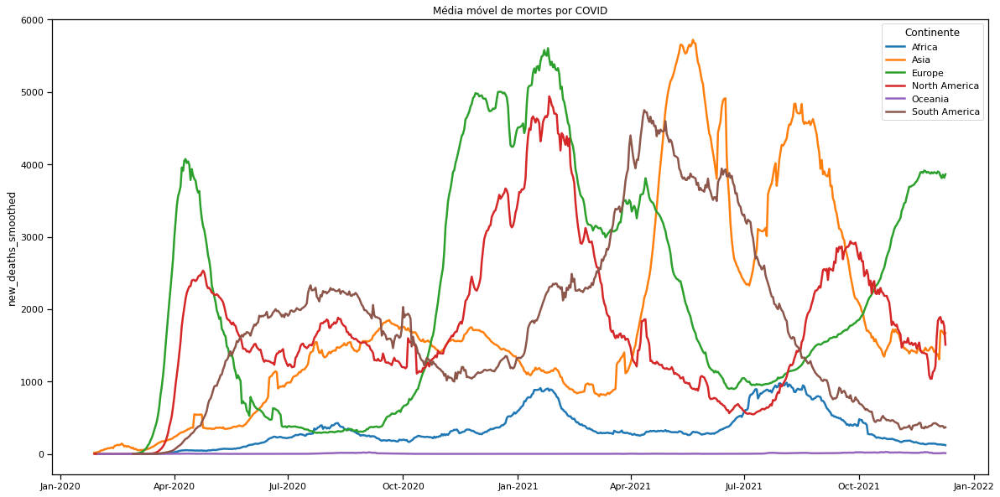

In [ ]:
# Evolução da média móvel de novas mortes por Covid por continente

sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})
fig,ax = plt.subplots(figsize=(20,10))

sns.lineplot(data=continents, x="date", y="new_deaths_smoothed", hue="location")

ax.set_title("Média móvel de mortes por COVID")
ax.ticklabel_format(useOffset=False, style='plain', axis='y')
ax.xaxis.label.set_visible(False)

plt.legend(title='Continente')



plt.gcf().axes[0].xaxis.set_major_formatter(formatter)





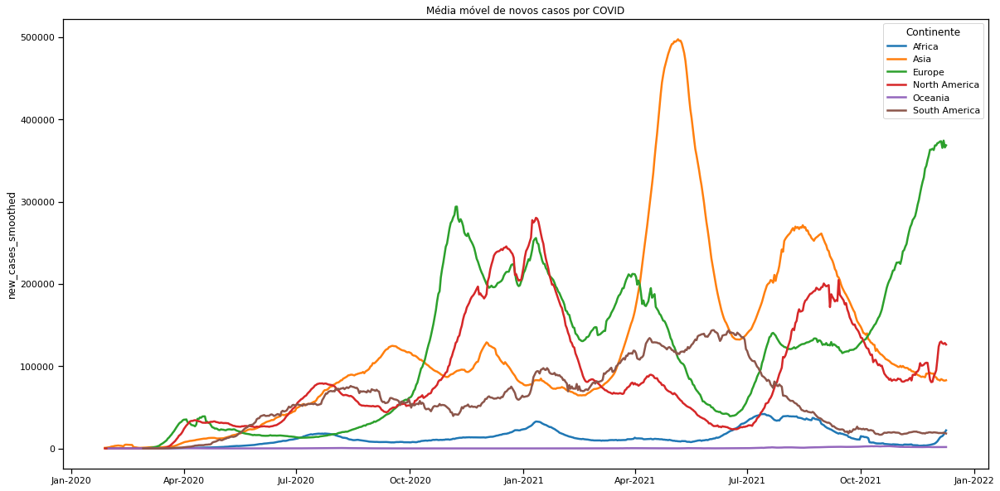

In [ ]:
# Evolução da média móvel de casos por Covid por continente
sns.set_context("notebook", font_scale=1, rc={"lines.linewidth": 2.5})

fig,ax = plt.subplots(figsize=(20,10))

sns.lineplot(data=continents, x="date", y="new_cases_smoothed", hue="location")

ax.set_title("Média móvel de novos casos por COVID")
ax.ticklabel_format(useOffset=False, style='plain', axis='y')
ax.xaxis.label.set_visible(False)

plt.legend(title='Continente')



plt.gcf().axes[0].xaxis.set_major_formatter(formatter)




###Plotando os gráficos de 'bar racing' para casos e mortes totais:

In [27]:
#Preparando os dataframes para plotagem
c_cases = continents.pivot(index='date', columns='location', values='total_cases')
c_deaths = continents.pivot(index='date', columns='location', values='total_deaths')

In [ ]:
# criando o plot customizado para casos
bcr.bar_chart_race(
    df=c_cases, # selecionando os dados
    filename=None, # nomeando o arquivo
    orientation='h', # orientação do gráfico
    sort='desc', # organização 
    n_bars=5, # número de barras
    fixed_order=False, # ordem fixa
    fixed_max=True, # máximo fixo
    steps_per_period=10, # steps por período
    interpolate_period=False, # interpolar o período
    label_bars=True, # colocar labels nas barras
    bar_size=.95, # tamanho da barra
    period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'}, # labels dos períodos
    period_fmt='%B %d, %Y', # formato do período
    period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'Casos Totais: {v.nlargest(6).sum():,.0f}',
                                      'ha': 'right', 'size': 8, 'family': 'Courier New'}, # resumo do período
    perpendicular_bar_func='median', # função da barra perpendicular
    period_length=100,# tamanho do período
    figsize=(5, 3), # tamanho da período
    dpi=144, 
    cmap='dark12', # esquema de cores
    title='Casos de Covid por continente', # título
    title_size='', # tamamnho do título
    bar_label_size=7, # tamanho do label das barras
    tick_label_size=7, # tamanho do tick do label
    shared_fontdict={'family' : 'Helvetica', 'color' : '.1'}, # definindo a fonte
    scale='linear', # escala dos dados
    writer=None, # escrever no plot
    fig=None, # definir a figura
    bar_kwargs={'alpha': .7}, # kwargs
    filter_column_colors=False)  # filtrar cores das colunas


findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Courier New'] not found. Falling back to DejaVu Sans.


In [ ]:
# criando o plot customizado para mortes
bcr.bar_chart_race(
    df=c_deaths, # selecionando os dados
    filename=None, # nomeando o arquivo
    orientation='h', # orientação do gráfico
    sort='desc', # organização 
    n_bars=5, # número de barras
    fixed_order=False, # ordem fixa
    fixed_max=True, # máximo fixo
    steps_per_period=10, # steps por período
    interpolate_period=False, # interpolar o período
    label_bars=True, # colocar labels nas barras
    bar_size=.95, # tamanho da barra
    period_label={'x': .99, 'y': .25, 'ha': 'right', 'va': 'center'}, # labels dos períodos
    period_fmt='%B %d, %Y', # formato do período
    period_summary_func=lambda v, r: {'x': .99, 'y': .18,
                                      's': f'Mortes totais: {v.nlargest(6).sum():,.0f}',
                                      'ha': 'right', 'size': 8, 'family': 'Courier New'}, # resumo do período
    perpendicular_bar_func='median', # função da barra perpendicular
    period_length=100,# tamanho do período
    figsize=(5, 3), # tamanho da período
    dpi=144, 
    cmap='dark12', # esquema de cores
    title='Mortes por Covid por continente', # título
    title_size='', # tamamnho do título
    bar_label_size=7, # tamanho do label das barras
    tick_label_size=7, # tamanho do tick do label
    shared_fontdict={'family' : 'Helvetica', 'color' : '.1'}, # definindo a fonte
    scale='linear', # escala dos dados
    writer=None, # escrever no plot
    fig=None, # definir a figura
    bar_kwargs={'alpha': .7}, # kwargs
    filter_column_colors=False)  # filtrar cores das colunas


## Análise Exploratória dos Dados dos países

Já observamos a evolução da COVID-19 no cenário mundial e continental, agora vamos analisar os cenários nacionais.
É preciso observar que quando agregamos a análise a macro componentes (mundo e continentes) perdemos a capacidade de observar as nuances internas. Num sentido oposto, quando analisamos dados em maior nível de desagregação as diferenças são mais visíveis mas perdemos em capacidade de generalização.
Como no caso da COVID-19 as diferenças entre os países, e mesmo dentro deles, é muito grande - seja pela constituição populacional do país, pela zona geográfica, pela data de infecção primária, entre outras - buscarei analisar o caso brasileiro como foco, buscando comparações que penso pertinentes quando houver correlações e dados disponíveis.

Começarei pelo Brasil:

In [ ]:
#Selecionando apenas o Brasil
br = countries.loc[countries.location=='Brazil']

In [ ]:
#Quando se deu a primeira infecção detectada
br.date[br.total_cases==1].min()

Timestamp('2020-02-26 00:00:00')

In [ ]:
#Quando se deu a primeira morte ?
br.date[br.total_deaths==1].min()

Timestamp('2020-03-17 00:00:00')

In [ ]:
# Diferença temporal
br.date[br.total_deaths==1].min()-br.date[br.total_cases==1].min()

Timedelta('20 days 00:00:00')

In [ ]:
#Qual a data da primeira vacinação?
br.date[br.people_vaccinated== br.people_vaccinated[br.people_vaccinated >0].iloc[0]].min()


Timestamp('2021-01-17 00:00:00')

A primeira infecção no Brasil se deu em 26 de Fevereiro de 2020. Já a primeira morte em 17 Março do mesmo ano - uma diferença de 20 dias. Já a vacinação iniciou em 17 de Janeiro de 2021

### Como foram as curvas de infecção e mortes?

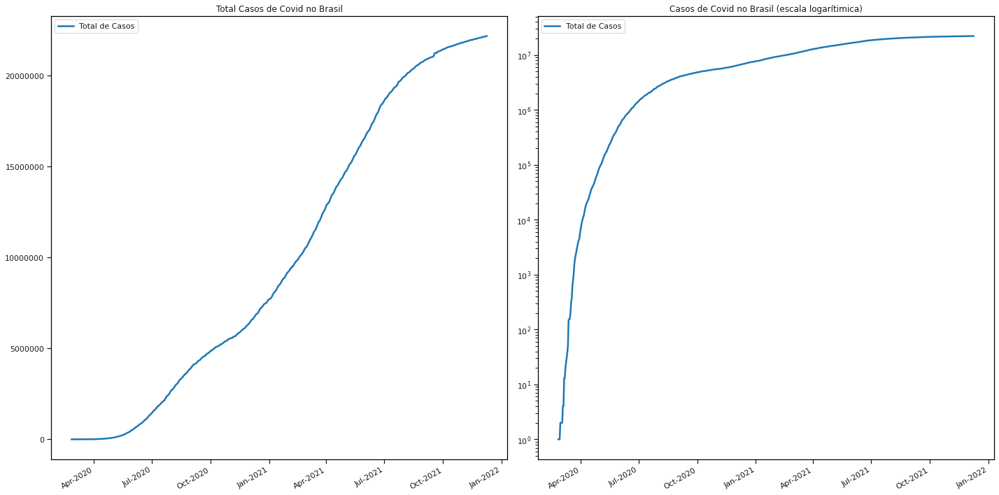

In [ ]:
# Evolução dos Casos de Covid no Brasil ao longo do tempo

#Iniciando o gráfico
fig,ax = plt.subplots(nrows=1, ncols=2,figsize=(20,10))

#Plotando o gráfico
br.plot(y='total_cases' , x = 'date', ax=ax[0])

#Título
ax[0].set_title("Total Casos de Covid no Brasil")

#Retirando a notação científica
ax[0].ticklabel_format(useOffset=False, style='plain', axis='y')

#Retirando o label do eixo x
ax[0].xaxis.label.set_visible(False)

#Adicionando a legenda
ax[0].legend(labels=['Total de Casos'], loc='upper left')


# Evolução dos Casos de Covid no Brasil ao longo do tempo em escala logarítimica

#Plotando o gráfico
br.plot(y='total_cases' , x = 'date', ax=ax[1])

#Escala logaritimica
ax[1].set_yscale('log')


#Título
ax[1].set_title("Casos de Covid no Brasil (escala logarítimica)")


#Retirando o label do eixo x
ax[1].xaxis.label.set_visible(False)

#Adicionando a legenda
ax[1].legend(labels=['Total de Casos'], loc='upper left')


#Modificando o eixo
plt.gcf().axes[0].xaxis.set_major_formatter(formatter)
plt.gcf().axes[1].xaxis.set_major_formatter(formatter)


plt.tight_layout()

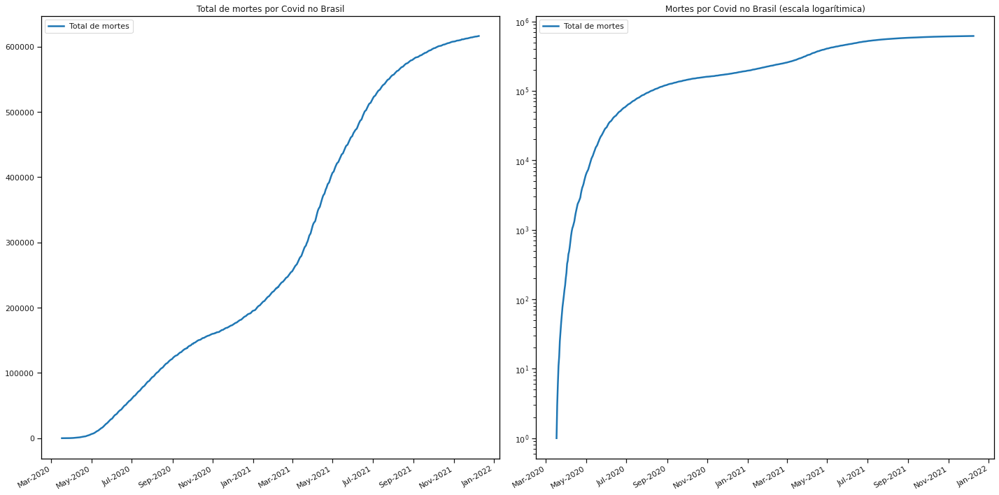

In [ ]:
# Evolução das mortes por Casos de Covid no Brasil ao longo do tempo

#Iniciando o gráfico
fig,ax = plt.subplots(nrows=1, ncols=2,figsize=(20,10))

#Plotando o gráfico
br.plot(y='total_deaths' , x = 'date', ax=ax[0])

#Título
ax[0].set_title("Total de mortes por Covid no Brasil")

#Retirando a notação científica
ax[0].ticklabel_format(useOffset=False, style='plain', axis='y')

#Retirando o label do eixo x
ax[0].xaxis.label.set_visible(False)

#Adicionando a legenda
ax[0].legend(labels=['Total de mortes'], loc='upper left')


# Evolução das mortes por Covid no Brasil ao longo do tempo em escala logarítimica

#Plotando o gráfico
br.plot(y='total_deaths' , x = 'date', ax=ax[1])

#Escala logaritimica
ax[1].set_yscale('log')


#Título
ax[1].set_title("Mortes por Covid no Brasil (escala logarítimica)")


#Retirando o label do eixo x
ax[1].xaxis.label.set_visible(False)

#Adicionando a legenda
ax[1].legend(labels=['Total de mortes'], loc='upper left')


#Modificando o eixo
plt.gcf().axes[0].xaxis.set_major_formatter(formatter)
plt.gcf().axes[1].xaxis.set_major_formatter(formatter)


plt.tight_layout()

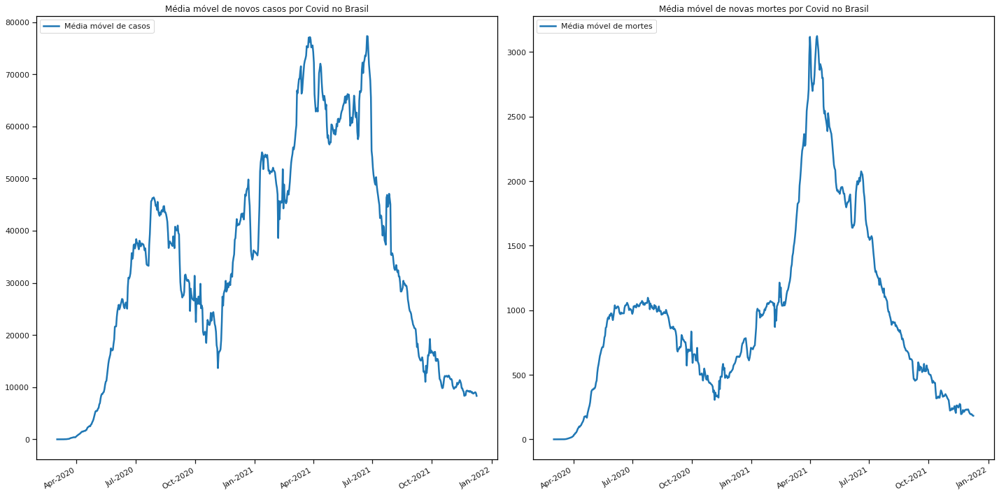

In [ ]:
# Evolução dos Casos de Covid no Brasil ao longo do tempo (média móvel)

#Iniciando o gráfico
fig,ax = plt.subplots(nrows=1, ncols=2,figsize=(20,10))

#Plotando o gráfico
br.plot(y='new_cases_smoothed' , x = 'date', ax=ax[0])

#Título
ax[0].set_title("Média móvel de novos casos por Covid no Brasil")

#Retirando a notação científica
ax[0].ticklabel_format(useOffset=False, style='plain', axis='y')

#Retirando o label do eixo x
ax[0].xaxis.label.set_visible(False)

#Adicionando a legenda
ax[0].legend(labels=['Média móvel de casos'], loc='upper left')


# Evolução dos Casos de Covid no Brasil ao longo do tempo (média móvel)

#Plotando o gráfico
br.plot(y='new_deaths_smoothed' , x = 'date', ax=ax[1])

#Título
ax[1].set_title("Média móvel de novas mortes por Covid no Brasil")


#Retirando o label do eixo x
ax[1].xaxis.label.set_visible(False)

#Adicionando a legenda
ax[1].legend(labels=['Média móvel de mortes'], loc='upper left')

#Modificando o eixo
plt.gcf().axes[0].xaxis.set_major_formatter(formatter)
plt.gcf().axes[1].xaxis.set_major_formatter(formatter)



plt.tight_layout()

### Qual a relação da vacinação com a diminuição de mortes?

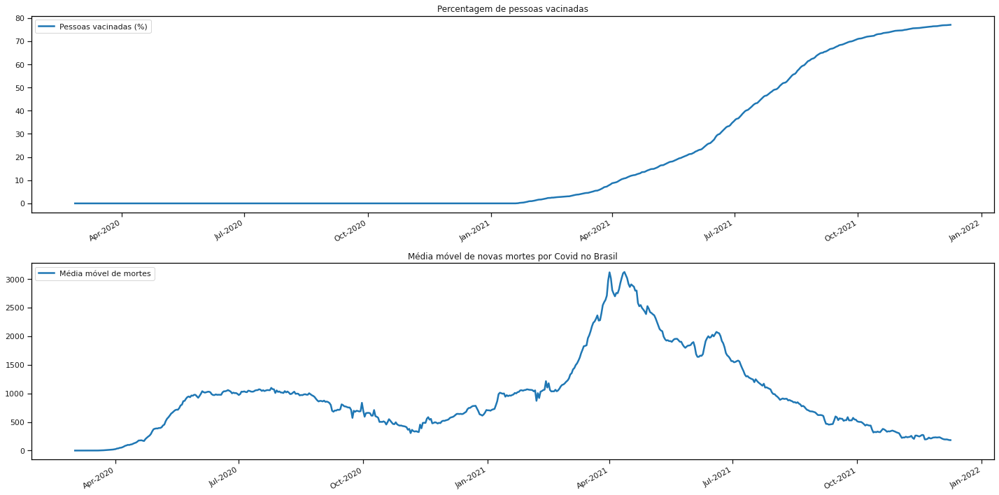

In [ ]:
# Evolução da vacinação (uma dose) X evolução da média móvel de mortes

#Iniciando o gráfico
fig,ax = plt.subplots(nrows=2, ncols=1,figsize=(20,10))

#Plotando o gráfico
br.plot(y='people_vaccinated_per_hundred' , x = 'date', ax=ax[0])

#Título
ax[0].set_title("Percentagem de pessoas vacinadas")

#Retirando a notação científica
ax[0].ticklabel_format(useOffset=False, style='plain', axis='y')

#Retirando o label do eixo x
ax[0].xaxis.label.set_visible(False)

#Adicionando a legenda
ax[0].legend(labels=['Pessoas vacinadas (%)'], loc='upper left')


# Evolução dos Casos de Covid no Brasil ao longo do tempo (média móvel)

#Plotando o gráfico
br.plot(y='new_deaths_smoothed' , x = 'date', ax=ax[1])

#Título
ax[1].set_title("Média móvel de novas mortes por Covid no Brasil")


#Retirando o label do eixo x
ax[1].xaxis.label.set_visible(False)

#Adicionando a legenda
ax[1].legend(labels=['Média móvel de mortes'], loc='upper left')

#Modificando o eixo
plt.gcf().axes[0].xaxis.set_major_formatter(formatter)
plt.gcf().axes[1].xaxis.set_major_formatter(formatter)



plt.tight_layout()

### Análises comparativas entre os países e o Brasil

Quais países apresentam as maiores taxas de infecções e mortes ?

In [ ]:
#10 Países com mais casos
countries.loc[countries.date == countries.date.max(), ['location', 'total_cases']].sort_values(by='total_cases', ascending= False)[:10]

,location,total_cases
131806,United States,49661145.0
57584,India,34674643.0
17943,Brazil,22177059.0
131118,United Kingdom,10722083.0
103669,Russia,9752340.0
127820,Turkey,8986377.0
44593,France,8209911.0
47506,Germany,6442846.0
59564,Iran,6147872.0
5560,Argentina,5350867.0


In [ ]:
#10 Países com mais mortes
countries.loc[countries.date == countries.date.max(), ['location', 'total_deaths']].sort_values(by='total_deaths', ascending= False)[:10]

,location,total_deaths
131806,United States,794649.0
17943,Brazil,616457.0
57584,India,474479.0
81811,Mexico,296188.0
103669,Russia,280427.0
99616,Peru,201527.0
131118,United Kingdom,146592.0
58232,Indonesia,143918.0
62530,Italy,134551.0
59564,Iran,130524.0


In [ ]:
#10 Países com mais casos por milhão de habitantes
countries.loc[countries.date == countries.date.max(), ['location', 'total_cases_per_million']].sort_values(by='total_cases_per_million', ascending= False)[:10]

,location,total_cases_per_million
84699,Montenegro,253504.891
3276,Andorra,249140.316
110531,Seychelles,240683.450
112692,Slovakia,231664.434
46823,Georgia,220959.336
32441,Czechia,214315.785
113369,Slovenia,209920.225
107331,San Marino,186915.613
109896,Serbia,184879.329
73273,Lithuania,180761.690


In [ ]:
#10 Países com mais casos
countries.loc[countries.date == countries.date.max(), ['location', 'total_deaths_per_million']].sort_values(by='total_deaths_per_million', ascending= False)[:10]

,location,total_deaths_per_million
99616,Peru,6041.083
19423,Bulgaria,4260.326
16670,Bosnia and Herzegovina,3947.345
56251,Hungary,3764.001
84699,Montenegro,3728.997
93274,North Macedonia,3694.792
32441,Czechia,3182.324
46823,Georgia,3161.487
102990,Romania,3002.650
17943,Brazil,2880.728


Novamento vemos como os dados totais e os ponderados diferem. Sem ponderação observamos que a combinação de países populosos com alta taxa de incidência do vírus faz com que EUA, Brasil e Índia apareçam como os três mais afetados.
Ponderando os dados por milhão de habitantes esses países (com a exceção do Brasil no caso das mortes) nem aparecem no ranking.
A ponderação dos dados também nos leva a ver que os países com muitos casos tendem a ser países de menor porte que provavelmente tem alta taxa de testagem. No caso das mortes é interessante notar que há pouca relaçao com os casos ponderados - tendo o Peru e os países do leste europeu como destaque.

Os dados de mortes são mais confiáveis do que os de casos (pois esses variam de acordo com a testagem).
O gráfico intereativo a seguir mostra a curva de mortes por milhão entre o Brasil e um país selecionado pelo usuário:

In [31]:
def f(country):
  #Iniciando o gráfico
  fig,ax = plt.subplots(figsize=(20,10))

  #Plotando o gráfico
  countries.loc[countries.location == 'Brazil'].plot(y='total_deaths_per_million' , x = 'date', ax=ax)
  countries.loc[countries.location == country].plot(y='total_deaths_per_million' , x = 'date', ax=ax)

  #Título
  ax.set_title(f"Mortes por Covid por milhão de habitantes: Brasil X {country}")

  #Retirando a notação científica
  ax.ticklabel_format(useOffset=False, style='plain', axis='y')

  #Retirando o label do eixo x
  ax.xaxis.label.set_visible(False)

  #Adicionando a legenda
  ax.legend(labels=['Total de mortes no Brasil', f'Total de mortes no(a) {country}'], loc='upper left')

  #Modificando o eixo
  plt.gcf().axes[0].xaxis.set_major_formatter(formatter)


  plt.tight_layout();

In [32]:
interact(f,country = countries.location.unique())

interactive(children=(Dropdown(description='country', options=('Afghanistan', 'Albania', 'Algeria', 'Andorra',…

<function __main__.f>

Gráfico interativo entre a média móvel de novas mortes no Brasil e em um país selecionado:

In [ ]:
def f(country):
  #Iniciando o gráfico
  fig,ax = plt.subplots(figsize=(20,10))

  #Plotando o gráfico
  countries.loc[countries.location == 'Brazil'].plot(y='new_deaths_smoothed_per_million' , x = 'date', ax=ax)
  countries.loc[countries.location == country].plot(y='new_deaths_smoothed_per_million' , x = 'date', ax=ax)

  #Título
  ax.set_title(f"Média móvel de novas mortes por Covid por milhão de habitantes: Brasil X {country}")

  #Retirando a notação científica
  ax.ticklabel_format(useOffset=False, style='plain', axis='y')

  #Retirando o label do eixo x
  ax.xaxis.label.set_visible(False)

  #Adicionando a legenda
  ax.legend(labels=['Média de novas mortes no Brasil', f'Média de novas mortes no(a) {country}'], loc='upper left')

  #Modificando o eixo
  plt.gcf().axes[0].xaxis.set_major_formatter(formatter)


  plt.tight_layout();

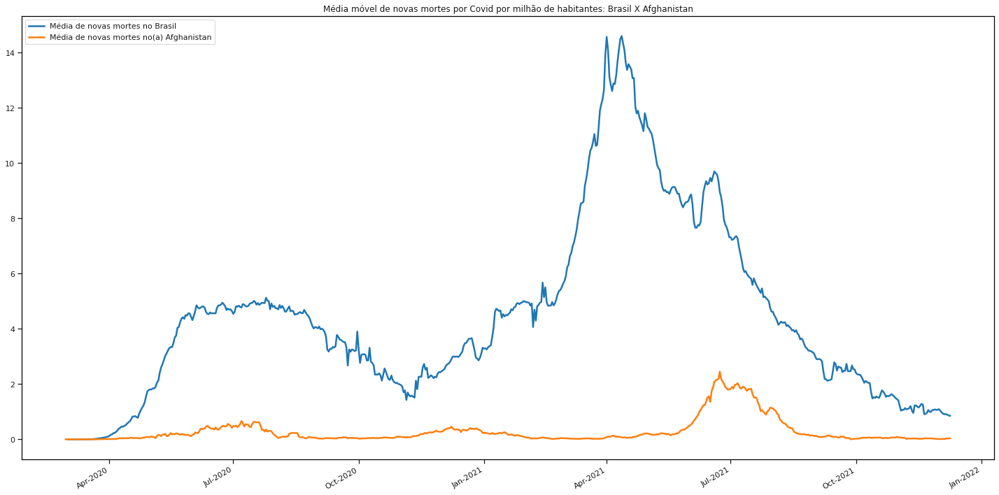

<function __main__.f>

In [ ]:
interact(f,country = countries.location.unique())

### Quais correlações as variáveis guardam entre casos e mortes?

Primeiramente retirarei algumas variáveis do dataset para manter apenas as de interesse.

In [ ]:
countries_clean = countries.drop(["iso_code",	'continent','new_cases', 'new_deaths', 'total_vaccinations',
                                  'people_vaccinated',	'people_fully_vaccinated',	'total_boosters',
                                  'new_vaccinations',	'new_vaccinations_smoothed','total_boosters_per_hundred',
                                  'new_vaccinations_smoothed_per_million',	'new_people_vaccinated_smoothed',
                                  'new_people_vaccinated_smoothed_per_hundred', 	"new_deaths_smoothed",
                                  'new_cases_per_million', 'new_cases_smoothed',
                                  'new_cases_smoothed_per_million', 'new_deaths_per_million',
                                  'new_deaths_smoothed_per_million', 'total_vaccinations_per_hundred',
                                  'people_fully_vaccinated_per_hundred','people_vaccinated_per_hundred' ], axis=1)

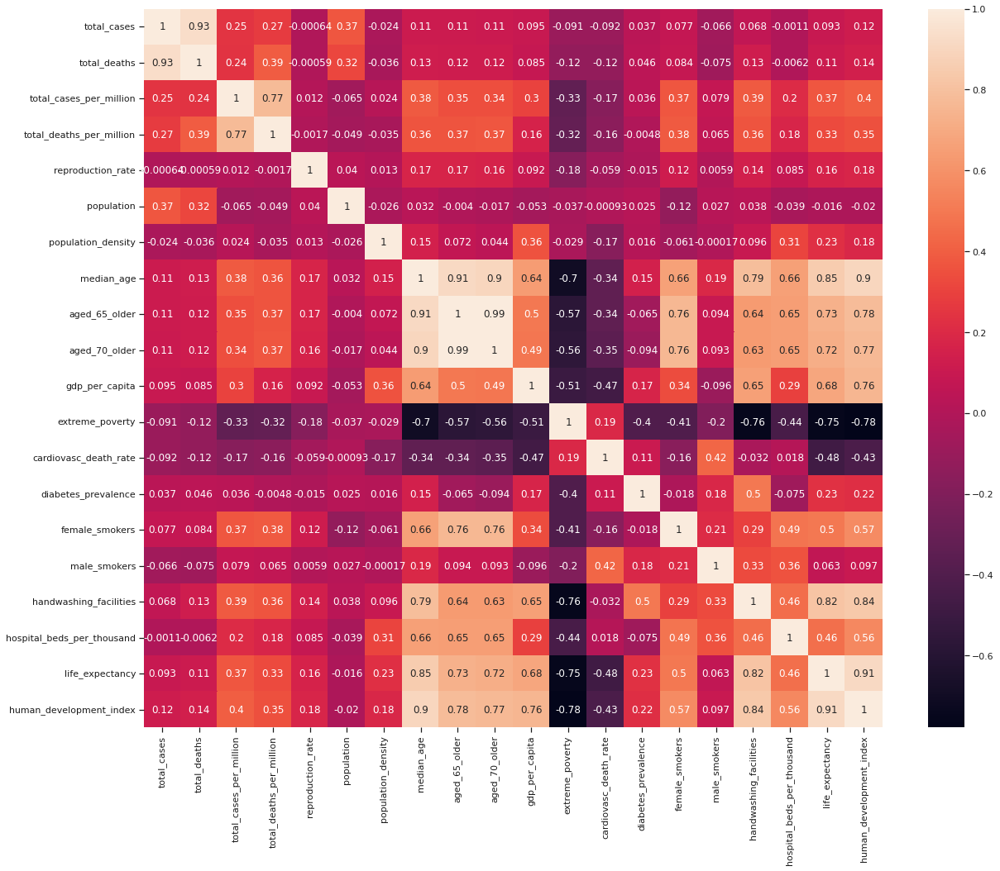

In [ ]:
plt.subplots(figsize=(20,16))
corr = countries_clean.corr()
svm = sns.heatmap(corr, annot=True)

In [ ]:
corr['total_deaths_per_million'].sort_values()

extreme_poverty              -0.317180
cardiovasc_death_rate        -0.155939
population                   -0.049231
population_density           -0.035471
diabetes_prevalence          -0.004839
reproduction_rate            -0.001693
male_smokers                  0.064775
gdp_per_capita                0.160985
hospital_beds_per_thousand    0.179639
total_cases                   0.271151
life_expectancy               0.333056
human_development_index       0.352993
handwashing_facilities        0.361688
median_age                    0.361982
aged_65_older                 0.367994
aged_70_older                 0.368270
female_smokers                0.382126
total_deaths                  0.393258
total_cases_per_million       0.771374
total_deaths_per_million      1.000000
Name: total_deaths_per_million, dtype: float64

In [ ]:
corr['total_cases_per_million'].sort_values()

extreme_poverty              -0.328575
cardiovasc_death_rate        -0.172373
population                   -0.064790
reproduction_rate             0.011924
population_density            0.024384
diabetes_prevalence           0.036381
male_smokers                  0.078665
hospital_beds_per_thousand    0.204669
total_deaths                  0.239275
total_cases                   0.245135
gdp_per_capita                0.303986
aged_70_older                 0.344915
aged_65_older                 0.346924
life_expectancy               0.372821
female_smokers                0.374287
median_age                    0.384083
handwashing_facilities        0.386731
human_development_index       0.402167
total_deaths_per_million      0.771374
total_cases_per_million       1.000000
Name: total_cases_per_million, dtype: float64

In [ ]:
countries_clean.isnull().sum().sort_values(ascending=False)/137628

handwashing_facilities        0.511655
extreme_poverty               0.365253
male_smokers                  0.281345
female_smokers                0.271551
hospital_beds_per_thousand    0.158558
reproduction_rate             0.153900
total_deaths                  0.137058
total_deaths_per_million      0.137058
aged_65_older                 0.089756
aged_70_older                 0.084896
median_age                    0.080151
cardiovasc_death_rate         0.078843
human_development_index       0.077942
gdp_per_capita                0.074556
total_cases_per_million       0.056151
total_cases                   0.056151
diabetes_prevalence           0.049496
population_density            0.036599
life_expectancy               0.011800
population                    0.002303
date                          0.000000
location                      0.000000
dtype: float64

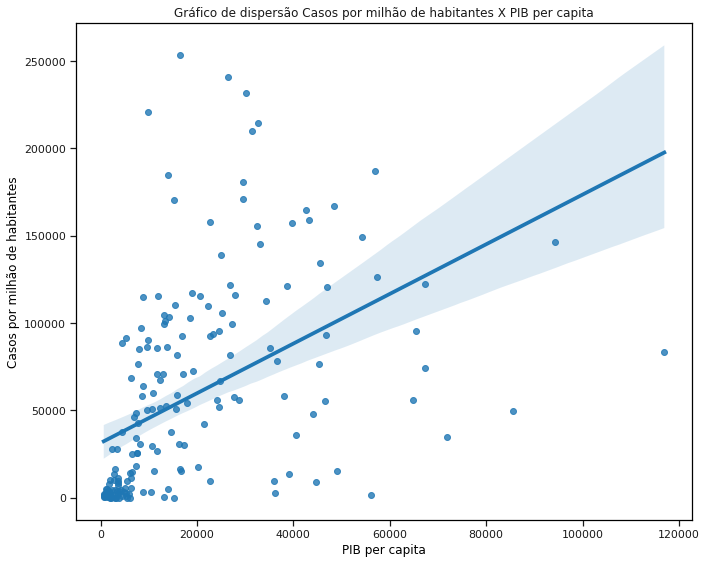

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
sns.regplot(data=countries_clean.loc[countries.date == countries.date.max()], x="gdp_per_capita", y="total_cases_per_million", ax=ax, )
ax.set_title("Gráfico de dispersão Casos por milhão de habitantes X PIB per capita")
ax.set_xlabel('PIB per capita')
ax.set_ylabel('Casos por milhão de habitantes')
plt.tight_layout();

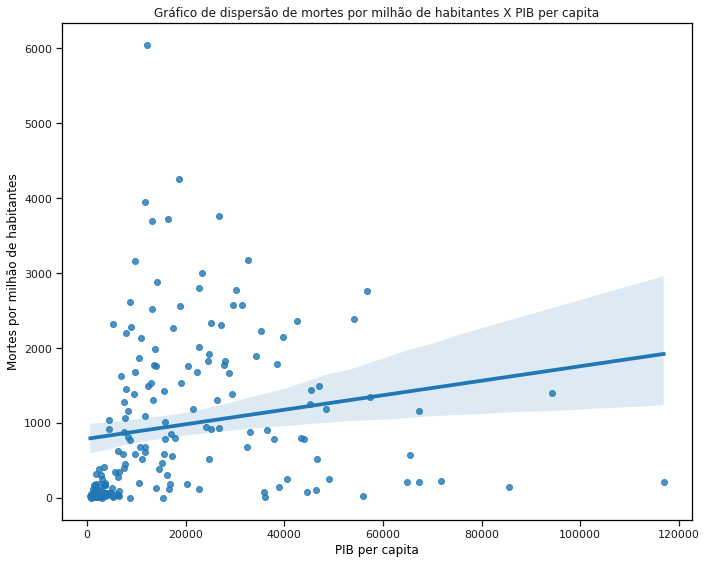

In [ ]:
fig, ax = plt.subplots(figsize=(10,8))
sns.regplot(data=countries_clean.loc[countries.date == countries.date.max()], x="gdp_per_capita", y="total_deaths_per_million", ax=ax, )
ax.set_title("Gráfico de dispersão de mortes por milhão de habitantes X PIB per capita")
ax.set_xlabel('PIB per capita')
ax.set_ylabel('Mortes por milhão de habitantes')
plt.tight_layout();

As correlações mostram que variáveis como pobreza extrema e mortes por doenças cardiovasculares aumentam a chance de morte e casos (negativamente correlacionadas). É preciso salientar que no caso da variável extrema pobreza temos mais de 36% de dados faltantes- o que pode influenciar na correlação.

Entre as correlações positivas merece destaque o IDH (human_development_index) , as variáveis de idade (median_age, aged_65_older, aged_70_older ). Sabemos que a COVID-19 tende a apresentar casos mais graves entre aqueles com maior idade - o que poderia explicar essa correlação. No caso do IDH a princípio seria surpreendente a correlação, mas, por se tratar de um índice com uma componente etária, a correlação pode ser devida ao mesmo motivo da idade.

Interessante notar que a incidência de morte parece guardar maior correlação com mulheres fumantes do que com homens. Não é possível fazer maiores inferências quanto a isso pois faltam dados desagregados de sexo e idade.

Pelo gráfico e pela tabela também podemos notar como a correlção com o PIB per capita é mais forte com o número de casos por milhão de habitantes do que com relação ao número de mortes por milhão de habitantes.

## Conclusão

A pandemia causada pela COVID-19 continua infectando e causando mortes pelo mundo. Vimos que os casos e mortes se somam ao longo do tempo mas isso não ocorre de maneira linear. Antes temos as chamdas ondas, com fluxos e refluxos mundiais causados por diversas razões - dentre elas o surgimento de variáveis e vacinas.

Ao fragmentar essa análise para o nível continental ficam claras as diferenças regionais. Vemos como cada onda da doença afetou de maneira diferente essas regiões. A primeira e segunda ondas se pronunciam na Europa com uma forte terceira nas américas e posteriormente as ondas asiáticas que afetaram sobretudo a Índia. Atualmente vemo o Novo Continente liderando em mortes por milhão, seguidos do Velho Continente e da Ásia - Oceania é um caso constante de controle da doença.

Descendo mais um nível de desagregação dos dados chegamos aos países. Mesmo nesse nível as disparidades internas impactam na pandemia. Mas é a partir desse nível que podemos ver mais claramente como as diferentes características afetam o desenvolvimento da pandemia.

O caso brasileiro se apresenta como um dos piores mundialmente. Tendo a primeira infecção detectada em 26 de Fevereiro de 2020 e a primeira morte 20 dias depois, a vacinação só iniciou em 17 de Janeiro de 2021. Após uma primeira onda entre Abril e Outubro de 2020 uma segunda onda mais forte veio próxima de Março de 2021. Essa nova onda alcança um pico em Abril e começa a arrefecer então - em parte pelo avanço da vacinação que nesse mesmo mês começa a acelerar.

Esse cenário coloca o Brasil como segundo país com mais mortes totais atrás de EUA e à frente de Índia e entre os 10 países com mais mortes por milhão de habitantes.

O que leva cada país a ter um cenário melhor ou pior na pandemia ainda é incerto. Mas  a correlação dos dados apontam como possíveis causas a idade da população, a pobreza e doenças cardiovasculares. Outras relações poderiam ser feitas, mas seriam necessários dados mais desagregados para afirmar com maior grau de certeza - como é o caso de mulheres fumantes .